<a href="https://colab.research.google.com/github/ljtaylor99/AAI-521-Final-Project/blob/main/AAI_521_Final_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Import libraries
!pip install opendatasets
import pandas as pd
import cv2
import json
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import opendatasets as od
import glob
import os
import re
import pathlib
import imgaug as ia
ia.seed(1)
# imgaug uses matplotlib backend for displaying images
%matplotlib inline
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array
from imgaug import augmenters as iaa
# imageio library will be used for image input/output
import imageio
import PIL
from PIL import Image
import PIL.Image
import PIL.ImageShow
from google.colab.patches import cv2_imshow
import xml.etree.ElementTree as ET
import shutil

In [2]:
# Download datset from Kaggle to notebook directory
# https://www.geeksforgeeks.org/how-to-import-kaggle-datasets-directly-into-google-colab/
od.download('https://www.kaggle.com/datasets/responsibleailab/crop-disease-ghana')

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: lauren0831
Your Kaggle Key: ··········


100%|██████████| 18.7G/18.7G [03:28<00:00, 96.4MB/s]


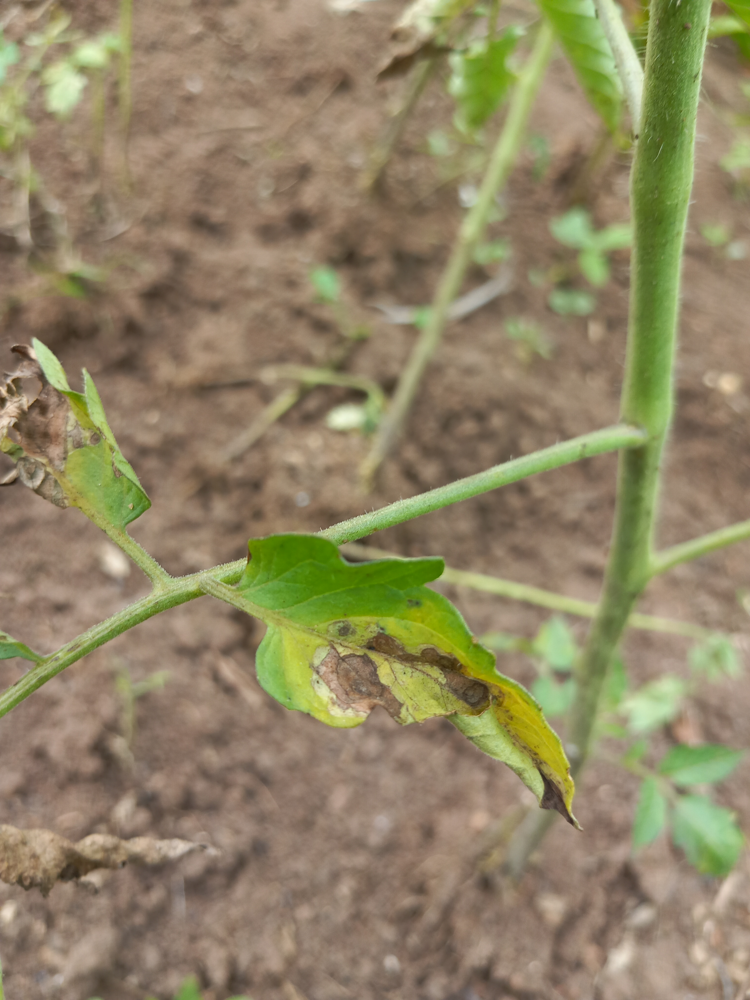

In [3]:
# Print out test image
test_img = '/content/crop-disease-ghana/input/Tomato/Tomato__Early_Blight/images/20230518_134246.jpg'
test_img = cv2.imread(test_img)
cv2_imshow(test_img)

In [4]:
# Show files in directory
os.listdir('/content/crop-disease-ghana/input')

['Pepper',
 'Tomato',
 'catyegory_index.pbtxt',
 'label_map.pbtxt',
 'label_map.json',
 'label_map.txt',
 'dataset_labels.csv',
 'Corn']

In [5]:
# Read csv file with data labels
labels_df = pd.read_csv('/content/crop-disease-ghana/input/dataset_labels.csv')
labels_df.head()

,filename,disease,crop,width,height,depth,xmin,ymin,xmax,ymax,ann_path,img_path
0,20230524_104642.jpg,Corn Cercospora Leaf Spot,Corn,4080,1836,3,2052.653343,695.836619,2210.117161,785.809054,input\Corn\Corn__Cercospora_Leaf_Spot\annotati...,input\Corn\Corn__Cercospora_Leaf_Spot\images\2...
1,20230524_104642.jpg,Corn Cercospora Leaf Spot,Corn,4080,1836,3,1110.682288,901.086237,1228.780152,982.623756,input\Corn\Corn__Cercospora_Leaf_Spot\annotati...,input\Corn\Corn__Cercospora_Leaf_Spot\images\2...
2,20230524_104642.jpg,Corn Cercospora Leaf Spot,Corn,4080,1836,3,1647.746382,912.332791,1791.150930,1002.305226,input\Corn\Corn__Cercospora_Leaf_Spot\annotati...,input\Corn\Corn__Cercospora_Leaf_Spot\images\2...
3,20230524_104642.jpg,Corn Cercospora Leaf Spot,Corn,4080,1836,3,2491.302550,1275.034169,2589.717436,1367.818243,input\Corn\Corn__Cercospora_Leaf_Spot\annotati...,input\Corn\Corn__Cercospora_Leaf_Spot\images\2...
4,20230524_104642.jpg,Corn Cercospora Leaf Spot,Corn,4080,1836,3,3326.423156,1255.352699,3410.778773,1339.701857,input\Corn\Corn__Cercospora_Leaf_Spot\annotati...,input\Corn\Corn__Cercospora_Leaf_Spot\images\2...


In [6]:
# Create new column combining width and height column
labels_df['shape'] = 0
shape_lst = []
for i in range(len(labels_df)):
  shape_lst.append((labels_df['width'][i],labels_df['height'][i]))

labels_df['shape'] = shape_lst
labels_df['shape'].value_counts()

(4032, 3024)    19548
(4080, 1836)    13500
(1920, 1280)    12418
(4080, 3060)     9007
(720, 480)       1473
(4000, 3000)     1123
(6720, 4480)      552
(1920, 2560)      428
(2560, 1920)      210
(2576, 1932)      102
Name: shape, dtype: int64

In [7]:
# Merge similar classes
labels_df.replace(['Pepper Late Blight','Pepper Early Blight'],'Pepper Leaf Blight',inplace = True)
labels_df.replace(['Tomato Late Blight','Tomato Early Blight'],'Tomato Leaf Blight',inplace = True)

In [8]:
labels_df = labels_df[labels_df['disease'] != 'Tomato Mosaic']
labels_df['disease'].value_counts()

Corn Cercospora Leaf Spot    9431
Tomato Septoria              9211
Tomato Leaf Blight           7993
Corn Streak                  4591
Tomato Healthy               4066
Pepper Septoria              3222
Pepper Leaf Mosaic           3047
Pepper Bacterial Spot        2780
Corn Common Rust             2434
Corn Healthy                 2304
Pepper Leaf Curl             2175
Pepper Leaf Blight           1660
Tomato Fusarium              1238
Pepper Healthy               1049
Pepper Cercospora             704
Pepper Fusarium               696
Tomato Leaf Curl              641
Tomato Bacterial Spot         639
Corn Northern Leaf Blight     234
Name: disease, dtype: int64

In [9]:
# Labels for categories
labels = {}
#np.unique(no_duplicates['disease'])
lab_len = len(np.unique(labels_df['disease']))
for j,i in zip(np.unique(labels_df['disease']),range(1,lab_len + 1)):
  labels[j] = i
print(labels)

{'Corn Cercospora Leaf Spot': 1, 'Corn Common Rust': 2, 'Corn Healthy': 3, 'Corn Northern Leaf Blight': 4, 'Corn Streak': 5, 'Pepper Bacterial Spot': 6, 'Pepper Cercospora': 7, 'Pepper Fusarium': 8, 'Pepper Healthy': 9, 'Pepper Leaf Blight': 10, 'Pepper Leaf Curl': 11, 'Pepper Leaf Mosaic': 12, 'Pepper Septoria': 13, 'Tomato Bacterial Spot': 14, 'Tomato Fusarium': 15, 'Tomato Healthy': 16, 'Tomato Leaf Blight': 17, 'Tomato Leaf Curl': 18, 'Tomato Septoria': 19}


In [10]:
# Use categorical labels to make new target column
enc_labels = []
for i in labels_df['disease']:
  for k,v in labels.items():
    if i == k :
      enc_labels.append(labels[i])
labels_df['label'] = enc_labels
labels_df.head()

,filename,disease,crop,width,height,depth,xmin,ymin,xmax,ymax,ann_path,img_path,shape,label
0,20230524_104642.jpg,Corn Cercospora Leaf Spot,Corn,4080,1836,3,2052.653343,695.836619,2210.117161,785.809054,input\Corn\Corn__Cercospora_Leaf_Spot\annotati...,input\Corn\Corn__Cercospora_Leaf_Spot\images\2...,"(4080, 1836)",1
1,20230524_104642.jpg,Corn Cercospora Leaf Spot,Corn,4080,1836,3,1110.682288,901.086237,1228.780152,982.623756,input\Corn\Corn__Cercospora_Leaf_Spot\annotati...,input\Corn\Corn__Cercospora_Leaf_Spot\images\2...,"(4080, 1836)",1
2,20230524_104642.jpg,Corn Cercospora Leaf Spot,Corn,4080,1836,3,1647.746382,912.332791,1791.150930,1002.305226,input\Corn\Corn__Cercospora_Leaf_Spot\annotati...,input\Corn\Corn__Cercospora_Leaf_Spot\images\2...,"(4080, 1836)",1
3,20230524_104642.jpg,Corn Cercospora Leaf Spot,Corn,4080,1836,3,2491.302550,1275.034169,2589.717436,1367.818243,input\Corn\Corn__Cercospora_Leaf_Spot\annotati...,input\Corn\Corn__Cercospora_Leaf_Spot\images\2...,"(4080, 1836)",1
4,20230524_104642.jpg,Corn Cercospora Leaf Spot,Corn,4080,1836,3,3326.423156,1255.352699,3410.778773,1339.701857,input\Corn\Corn__Cercospora_Leaf_Spot\annotati...,input\Corn\Corn__Cercospora_Leaf_Spot\images\2...,"(4080, 1836)",1


In [11]:
# Fix img path
loc_path = '/content/crop-disease-ghana/'
new_img = []
for txt in labels_df['img_path']:
  n = loc_path + txt.replace('\\','/')
  new_img.append(n)
labels_df['img_path'] = new_img
labels_df['img_path'][0]

'/content/crop-disease-ghana/input/Corn/Corn__Cercospora_Leaf_Spot/images/20230524_104642.jpg'

In [12]:
# Fix annotation path
loc_path = '/content/crop-disease-ghana/'
new_ann = []
for txt in labels_df['ann_path']:
  a = loc_path + txt.replace('\\','/')
  new_ann.append(a)
labels_df['ann_path'] = new_ann
labels_df['ann_path'][0]

'/content/crop-disease-ghana/input/Corn/Corn__Cercospora_Leaf_Spot/annotations/20230524_104642.xml'

In [13]:
# Fix filenames
new_filename = []
for p in labels_df['img_path']:
  s = p.replace('/',' ')
  s_lst = s.split()
  new_filename.append(s_lst[-1])
labels_df['filename'] = new_filename

In [14]:
# Drop duplicates
no_duplicates = labels_df.drop_duplicates(subset = 'ann_path',ignore_index=True)
no_duplicates.reset_index()
no_duplicates.shape

(7479, 14)

<Axes: xlabel='crop', ylabel='count'>

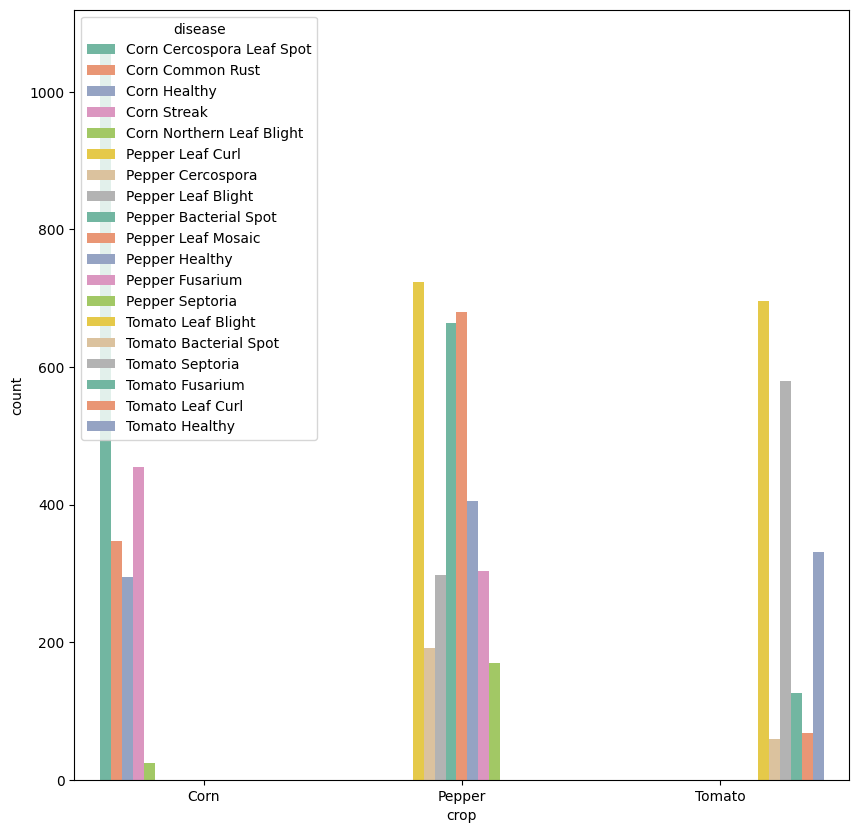

In [15]:
# Crop type and disease distribution
plt.figure(figsize = (10,10))
sns.countplot(x = no_duplicates['crop'],hue = no_duplicates['disease'],palette = 'Set2')

In [16]:
# Disease value counts
no_duplicates['disease'].value_counts()

Corn Cercospora Leaf Spot    1066
Pepper Leaf Curl              723
Tomato Leaf Blight            696
Pepper Leaf Mosaic            680
Pepper Bacterial Spot         664
Tomato Septoria               579
Corn Streak                   455
Pepper Healthy                405
Corn Common Rust              347
Tomato Healthy                331
Pepper Fusarium               303
Pepper Leaf Blight            298
Corn Healthy                  295
Pepper Cercospora             191
Pepper Septoria               169
Tomato Fusarium               126
Tomato Leaf Curl               68
Tomato Bacterial Spot          59
Corn Northern Leaf Blight      24
Name: disease, dtype: int64

### Looks like there is class imbalance. In order to address this problem, there should be a combination of resampling and data augmentation.

In [17]:
# https://medium.com/@a.karazhay/guide-augment-images-and-multiple-bounding-boxes-for-deep-learning-in-4-steps-with-the-notebook-9b263e414dac
# function to convert BoundingBoxesOnImage object into DataFrame
def bbs_obj_to_df(bbs_object):
#     convert BoundingBoxesOnImage object into array
    bbs_array = bbs_object.to_xyxy_array()
#     convert array into a DataFrame ['xmin', 'ymin', 'xmax', 'ymax'] columns
    df_bbs = pd.DataFrame(bbs_array, columns=['xmin', 'ymin', 'xmax', 'ymax'])
    return df_bbs

def image_aug(df,aug_images_path, image_prefix, augmentor,ref_df):
    # create data frame which we're going to populate with augmented image info
    aug_bbs_xy = pd.DataFrame(columns=
                              ['filename','width','height','label', 'xmin', 'ymin', 'xmax', 'ymax']
                             )
    grouped = df.groupby('filename')

    for filename,i in zip(df['filename'].unique(),range(len(df))):
    #   get separate data frame grouped by file name
        group_df = grouped.get_group(filename)
        group_df = group_df.reset_index()
        group_df = group_df.drop(['index'], axis=1)
    #   read the image
        image = imageio.imread(ref_df['img_path'][i])
    #   get bounding boxes coordinates and write into array
        bb_array = group_df.drop(['filename', 'width', 'height', 'label'], axis=1).values
    #   pass the array of bounding boxes coordinates to the imgaug library
        bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=image.shape)
    #   apply augmentation on image and on the bounding boxes
        image_aug, bbs_aug = augmentor(image=image, bounding_boxes=bbs)
    #   disregard bounding boxes which have fallen out of image pane
        bbs_aug = bbs_aug.remove_out_of_image()
    #   clip bounding boxes which are partially outside of image pane
        bbs_aug = bbs_aug.clip_out_of_image()

    #   don't perform any actions with the image if there are no bounding boxes left in it
        if re.findall('Image...', str(bbs_aug)) == ['Image([]']:
            pass

    #   otherwise continue
        else:
        #   write augmented image to a file
            imageio.imwrite(aug_images_path+image_prefix+filename, image_aug)
        #   create a data frame with augmented values of image width and height
            info_df = group_df.drop(['xmin', 'ymin', 'xmax', 'ymax'], axis=1)
            for index, _ in info_df.iterrows():
                info_df.at[index, 'width'] = image_aug.shape[1]
                info_df.at[index, 'height'] = image_aug.shape[0]
        #   rename filenames by adding the predifined prefix
            info_df['filename'] = info_df['filename'].apply(lambda x: image_prefix+x)
        #   create a data frame with augmented bounding boxes coordinates using the function we created earlier
            bbs_df = bbs_obj_to_df(bbs_aug)
        #   concat all new augmented info into new data frame
            aug_df = pd.concat([info_df, bbs_df], axis=1)
        #   append rows to aug_bbs_xy data frame
            aug_bbs_xy = pd.concat([aug_bbs_xy, aug_df])

    # return dataframe with updated images and bounding boxes annotations
    aug_bbs_xy = aug_bbs_xy.reset_index()
    aug_bbs_xy = aug_bbs_xy.drop(['index'], axis=1)
    return aug_bbs_xy


In [18]:
# Augmentors to use
aug_flip = iaa.Sequential([
    iaa.Fliplr(1)
])
aug_rotate = iaa.Sequential([
    iaa.Affine(rotate=(-60, 60))
])

aug_blur = iaa.Sequential([
    iaa.GaussianBlur(sigma=(1.0, 3.0))
])

aug_noise = iaa.Sequential([
  iaa.AdditiveGaussianNoise(scale=(0.03*255, 0.05*255))
])

In [19]:
# Going to augment rare classes the append augmented data to labels_df
cnlb_df = labels_df[labels_df['disease']=='Corn Northern Leaf Blight'].reset_index()
tlc_df = labels_df[labels_df['disease']=='Tomato Leaf Curl'].reset_index()
tbs_df = labels_df[labels_df['disease']=='Tomato Bacterial Spot'].reset_index()

# Make folders to store augmented images
!mkdir Corn_Leaf_Blight_Aug
!mkdir Tomato_Leaf_Curl_Aug
!mkdir Tomato_Bacterial_Spot_Aug

In [22]:
# '/content/Corn_Leaf_Blight_Aug'
# Create augmented data set
# NEED TO FIX THE IMAGES NOT GOING INTO THE PROPER FOLDERS
def make_aug(df,aug_dir):
  aug_list = [aug_flip,aug_rotate,aug_blur,aug_noise]

  aug_df = image_aug(df[['filename','width','height','label', 'xmin', 'ymin', 'xmax', 'ymax']],
                   aug_dir, 'flip', aug_list[0],df)
  label = ['rotate','blur','noise']
  for a,n in zip(aug_list[1:],label):
    aug_df.append(image_aug(df[['filename','width','height','label', 'xmin', 'ymin', 'xmax', 'ymax']],
                   aug_dir, n, a,df))
  # Drop rows with null
  aug_df = aug_df.dropna()
  return aug_df

In [23]:
# Make augmented corn northern leaf blight
cnlb_aug = make_aug(cnlb_df,'/content/Corn_Leaf_Blight_Aug')

<ipython-input-17-14c13015f77a>:23: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(ref_df['img_path'][i])
<ipython-input-17-14c13015f77a>:23: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(ref_df['img_path'][i])
<ipython-input-17-14c13015f77a>:23: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(ref_df['img_path'][i])
<

In [29]:
# Number of unique augmented image
len(cnlb_aug['filename'].unique())

83

In [30]:
# NEED TO FIX filename and add image path
cnlb_aug

,filename,width,height,label,xmin,ymin,xmax,ymax
0,flip2N8A1599.JPG,1920,1280,4,282.763916,143.105591,484.968994,304.901642
1,flip2N8A1609.JPG,1920,1280,4,442.670776,31.915113,581.697754,180.207047
2,flip2N8A1609.JPG,1920,1280,4,875.072510,843.814697,968.059021,917.660461
3,flip2N8A1688.JPG,1920,1280,4,1693.697144,572.799316,1911.120850,662.194824
4,flip2N8A1688.JPG,1920,1280,4,1547.417847,84.131454,1599.724121,284.471832
...,...,...,...,...,...,...,...,...
223,flipIMG_6985.jpeg,4032,3024,4,505.584717,2016.877563,875.358154,2099.206787
224,flipIMG_7002.jpeg,4032,3024,4,2099.986328,1518.381836,2419.257812,1577.278931
225,flipIMG_7002.jpeg,4032,3024,4,3452.309082,1928.745605,3736.084717,2021.756958
226,flipIMG_7039.jpeg,4032,3024,4,762.765869,1475.170410,1203.889648,1581.069336


In [31]:
cnlb_aug['filename'].unique()

array(['flip2N8A1599.JPG', 'flip2N8A1609.JPG', 'flip2N8A1688.JPG',
       'flip2N8A1689.JPG', 'flip2N8A9694.JPG', 'flip2N8A9695.JPG',
       'flip2N8A9700.JPG', 'flip2N8A9701.JPG', 'flipIMG_2082.jpeg',
       'flipIMG_2849.jpeg', 'flipIMG_2850.jpeg', 'flipIMG_2851.jpeg',
       'flipIMG_2854.jpeg', 'flipIMG_2858.jpeg', 'flipIMG_2859.jpeg',
       'flipIMG_2919.jpeg', 'flipIMG_2920.jpeg', 'flipIMG_2923.jpeg',
       'flipIMG_2924.jpeg', 'flipIMG_2925.jpeg', 'flipIMG_2926.jpeg',
       'flipIMG_2927.jpeg', 'flipIMG_2960.jpeg', 'flipIMG_2961.jpeg',
       'flipIMG_2967.jpeg', 'flipIMG_2968.jpeg', 'flipIMG_2969.jpeg',
       'flipIMG_2972.jpeg', 'flipIMG_2973.jpeg', 'flipIMG_2974.jpeg',
       'flipIMG_2975.jpeg', 'flipIMG_3377.jpeg', 'flipIMG_3378.jpeg',
       'flipIMG_3698.jpeg', 'flipIMG_3699.jpeg', 'flipIMG_3700.jpeg',
       'flipIMG_3704.jpeg', 'flipIMG_3705.jpeg', 'flipIMG_3706.jpeg',
       'flipIMG_3707.jpeg', 'flipIMG_3708.jpeg', 'flipIMG_3709.jpeg',
       'flipIMG_3710.jpeg', 

In [ ]:
# Define padding function
# Use this tutorial as a guide:
# https://note.nkmk.me/en/python-pillow-add-margin-expand-canvas/
def pad_img(im,top, right, bottom =0, left = 0, color = (0,0,0)):

    photo = Image.open(im)
    size = photo.size
    new_width = size[0] + right + left
    new_height = size[1] + top + bottom
    result = Image.new(photo.mode, (new_width, new_height), color)
    result.paste(photo, (left, top))
    return result
# Test out function
pad_img(no_duplicates['img_path'][0],500,350)